# Bayesian Geostatistical Modeling of Noise Pollution in Madrid

Alvin Bong

Noise pollution is a growing concern in urban environments due to its adverse impacts on health and well-being. This study models the spatial distribution of urban noise pollution in Madrid using a geostatistical approach. Noise measurements from monitoring stations were combined with elevation, vegetation (NDVI), and road network data from OpenStreetMap. A Bayesian spatial model using INLA-SPDE captured spatial dependence and produced an RMSE of about 3.2 dB. The resulting maps highlight higher noise near major roads and identify areas exceeding 62 dB as potential hotspots and those below 56 dB as low-exposure zones. The approach demonstrates the usefulness of spatial modeling for urban noise assessment and management.

In [ ]:
library(sf)

Linking to GEOS 3.13.0, GDAL 3.10.3, PROJ 9.6.2; sf_use_s2() is TRUE

Data (c) OpenStreetMap contributors, ODbL 1.0. https://www.openstreetmap.org/copyright

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.1     ✔ stringr   1.5.2
✔ lubridate 1.9.4     ✔ tibble    3.3.0
✔ purrr     1.1.0     ✔ tidyr     1.3.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

terra 1.8.70

Attaching package: 'terra'

The following object is masked from 'package:tidyr':

    extract

## Introduction

Urban noise pollution has emerged as one of the most critical environmental challenges in densely populated cities, affecting both public health and overall quality of life. For example, in 2011, an estimated one million healthy life years were lost from traffic-related noise in the western Europe alone \[@world2011burden\]. In metropolitan areas like Madrid, continuous exposure to traffic, industrial activity, and dense urban infrastructure contributes significantly to elevated sound levels.

Understanding the spatial distribution of noise and its relationship with urban features is therefore essential for sustainable urban planning and noise mitigation strategies.This study aims to model and map the spatial distribution of environmental noise levels across the city of Madrid using a geostatistical approach. The analysis combines monitoring station data with environmental covariates such as elevation, vegetation (NDVI), and distance to various road types derived from OpenStreetMap (OSM). By applying the Stochastic Partial Differential Equation (SPDE) framework within the Integrated Nested Laplace Approximation (INLA) methodology, spatial dependencies are explicitly captured, allowing for improved prediction and uncertainty quantification across unmonitored locations.

The results of this study contribute to a better understanding of the spatial patterns of noise exposure in Madrid and demonstrate the utility of Bayesian spatial modeling in environmental monitoring. Specifically, the project identifies potential high-risk (noisy) and low-risk (quiet) zones and provides exceedance probability maps to support data-driven decision-making in urban noise management.

## Data

### Study Area

The study focuses on the city of Madrid, Spain, selected due to its dense urban structure and availability of noise monitoring data. Administrative boundaries for Madrid were obtained from the GADM database at level 4 and converted to an sf object for spatial processing and visualization.

### Noise Data

Environmental noise measurements were sourced from the Madrid City Council’s monitoring network, containing 31 stations coordinates and annual mean sound levels (LAeq) (@. Data were cleaned, aggregated to the year 2024, and spatially transformed to the ETRS89 / UTM Zone 30N (EPSG:25830) coordinate reference system.

### Covariates

Five spatial covariates were used to explain the variability in noise levels:

**Elevation**: Extracted from the SRTM 30 arc-second global dataset using the geodata package, providing a proxy for terrain effects on noise propagation.

**Road Proximity**: Derived from OpenStreetMap (OSM) via the osmdata package, categorized into **major, secondary, and local roads**. Distances from each noise station to the nearest road of each type were calculated using `st_distance`.

**Vegetation (NDVI)**: A Normalized Difference Vegetation Index raster from June 2020 was used to represent surface greenness, indicating vegetation cover that can absorb or block noise.

<table style="width:100%;">
<colgroup>
<col style="width: 33%" />
<col style="width: 33%" />
<col style="width: 33%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div width="33.3%" data-layout-align="left">
<p>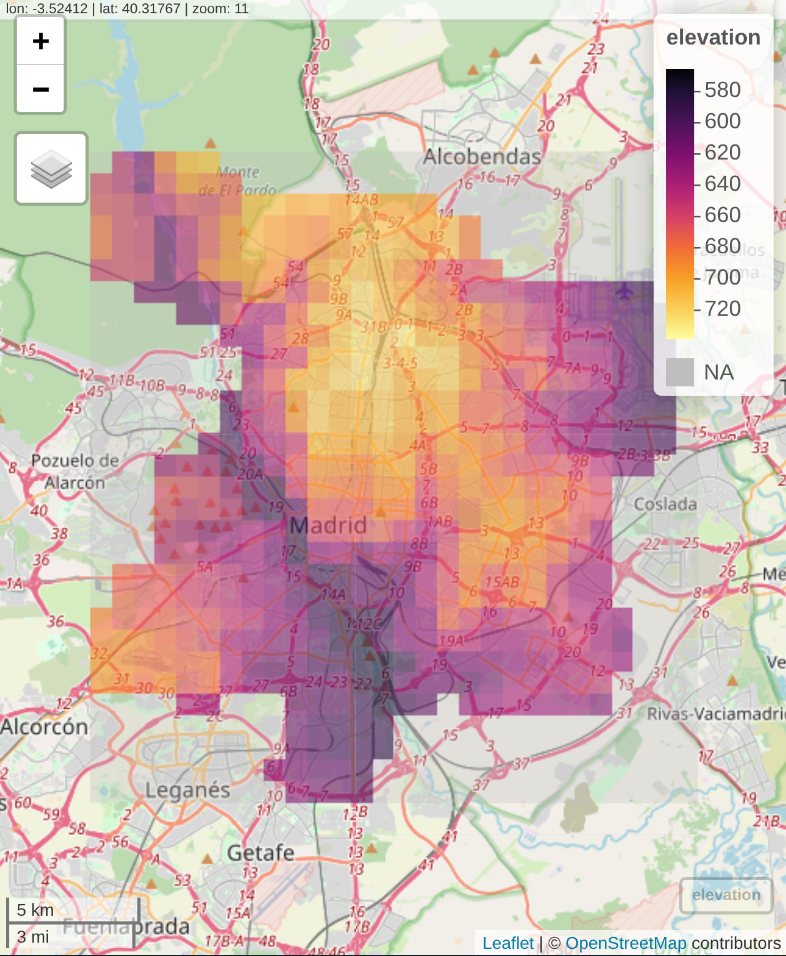</p>
</div></td>
<td style="text-align: left;"><div width="33.3%" data-layout-align="left">
<p>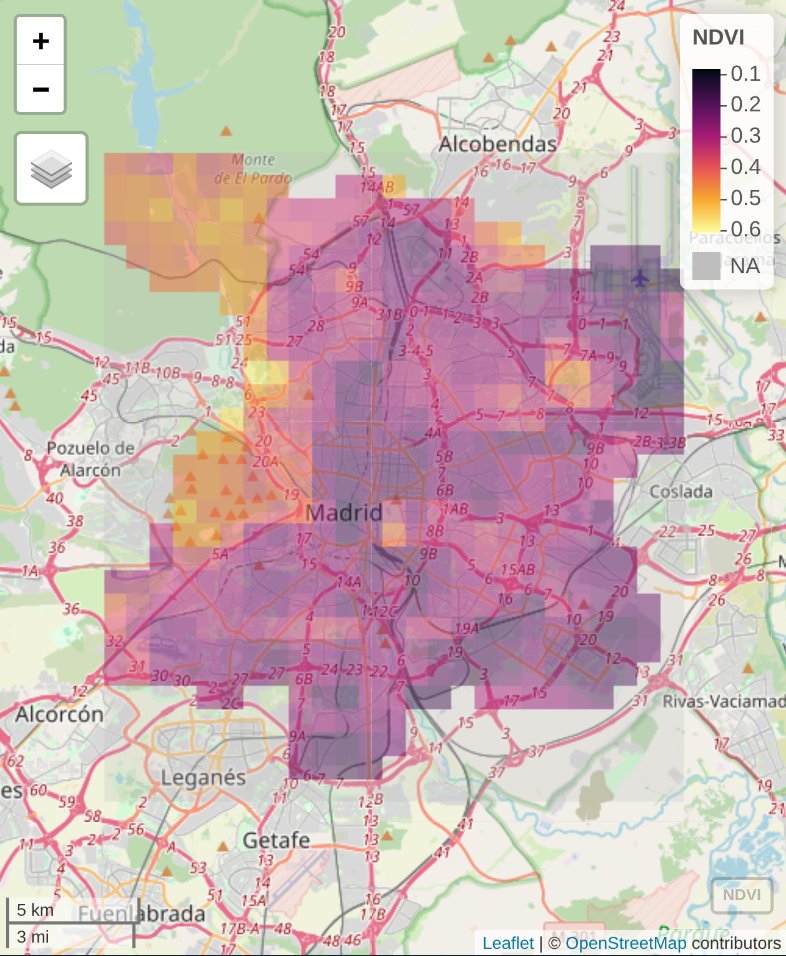</p>
</div></td>
<td style="text-align: left;"><div width="33.3%" data-layout-align="left">
<p>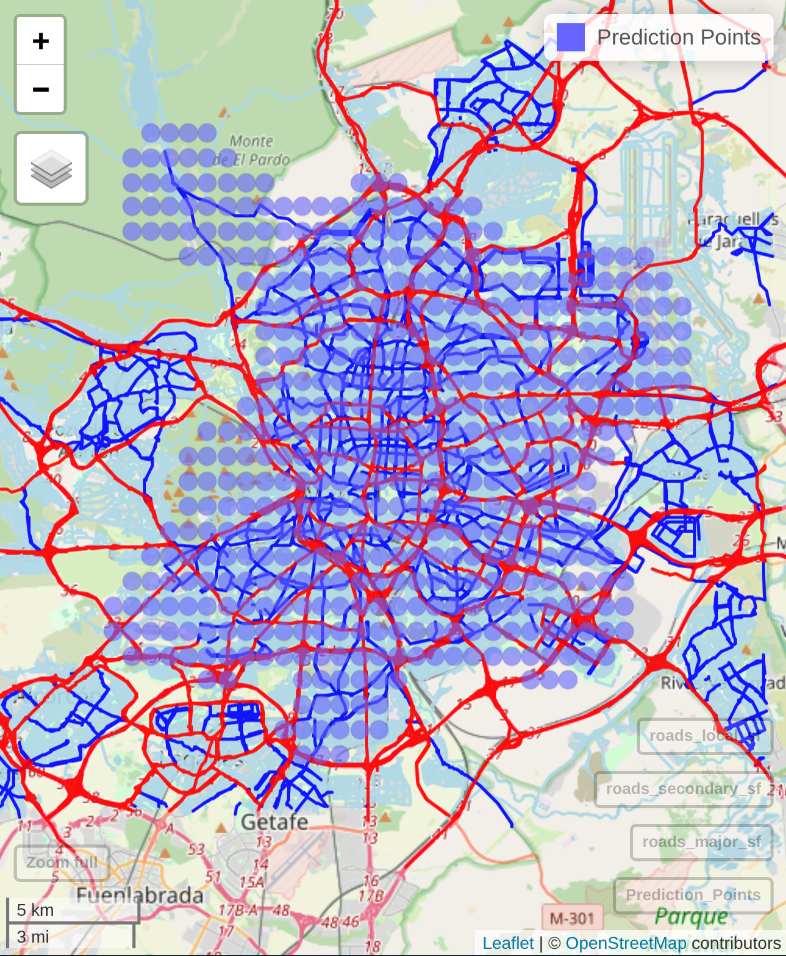</p>
</div></td>
</tr>
</tbody>
</table>

### Prediction Grid

A regular grid of prediction points was generated following the spatial extent and resolution of the elevation raster. Each grid point was assigned corresponding covariate values (elevation, NDVI, and road distances) to enable spatial prediction over the study area.

### Exploratory Data Analysis (EDA)

<table>
<colgroup>
<col style="width: 50%" />
<col style="width: 50%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div width="50.0%" data-layout-align="left">
<p>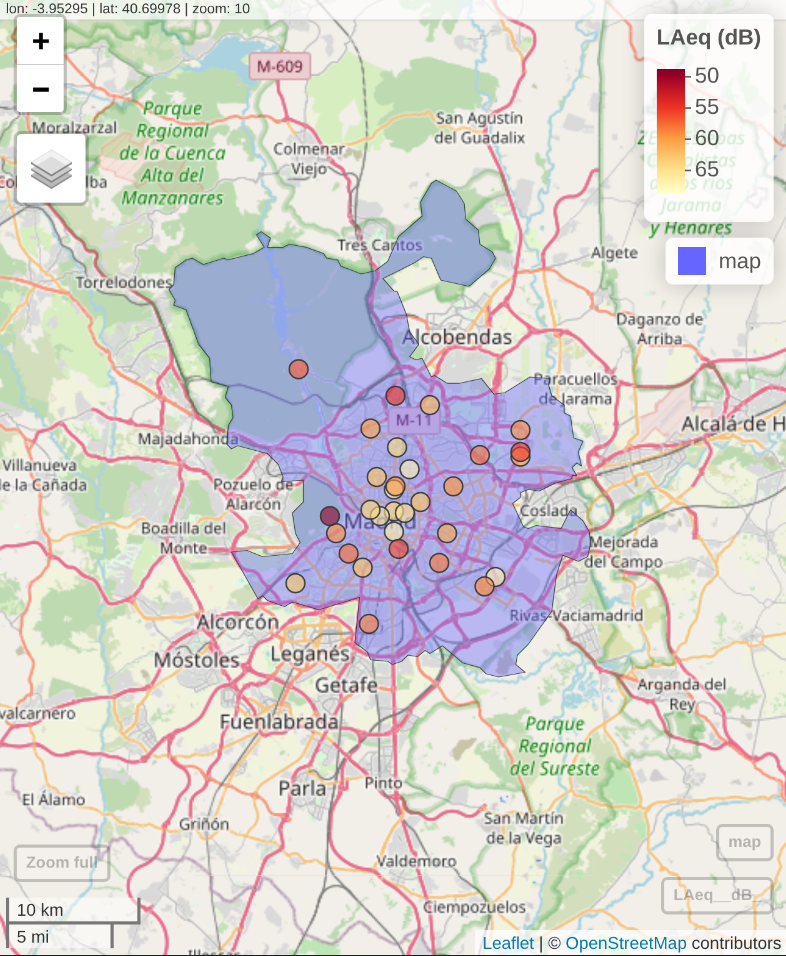</p>
</div></td>
<td style="text-align: left;"><div width="50.0%" data-layout-align="left">
<p>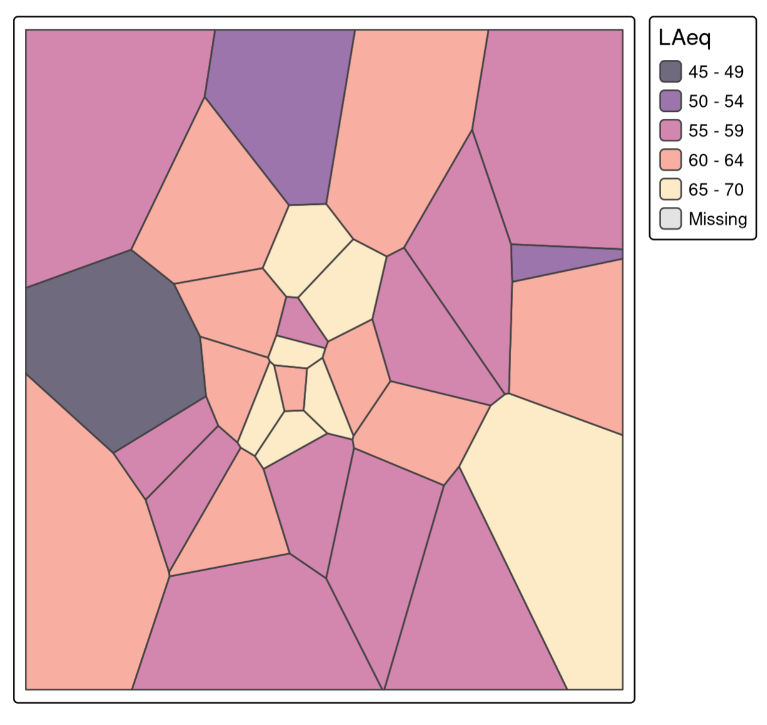</p>
</div></td>
</tr>
</tbody>
</table>

## Methods

### Model

Let $Y_i$ be the noise observed at locations $i \in \{1, \dotsc, n\}$. The model we use to predict noise level at unsampled locations is as follow:

$$
Y_i \mid \mu_i \sim \mathcal{N}(\mu_i,\sigma^2),
$$

$$
\mu_i = \beta_0 + \beta_1 \cdot \text{elev}_i + \beta_2 \cdot \text{ndvi}_i + 
\beta_3 \cdot \text{dist\_major}_i + \beta_4 \cdot \text{dist\_secondary}_i + 
\beta_5 \cdot \text{dist\_local}_i + S(\mathbf{x_i}),
$$

where:

-   $\beta_0$ is the intercept,
-   $\beta_1$, $\beta_2$, $\beta_3$, $\beta_4$ and $\beta_5$ are regression coefficients for the covariates
-   $S()$ is a spatial random effect that is modeled as a zero-mean Gaussian process with Matérn covariance function. Mesh for the SPDE was constructed using `inla.nonconvex.hull()`.

Model fitting was performed in a Bayesian framework using the Integrated Nested Laplace Approximation (INLA) \[@rue2009approximate\]. Model adequacy with respect to spatial structure is assessed by examining Root Mean Square Error (RMSE). Exceedance probabilities of the posterior estimates (predicted noise values) were computed to highlight regions with noise levels exceeding 62 dB and below 60 dB. These thresholds were chosen as representative reference points, approximately midway between the World Health Organization (WHO) guideline of ≤ 70 dB LAeq, 24h for leisure-related noise exposure and typical road traffic noise levels around 53 dB Lden (≈ 56 dB LAeq), given that most monitoring stations are located near road networks \[@world2018environmental; @seto2023conversions; @brink2018conversion\] .

## Results

The model estimated the intercept at $\hat{\beta}_{0} = 31.49$ (95%~CI: 4.14, 56.46). Among the covariates, elevation and secondary-road distance were found to have the most notable effects on predicted noise levels. The coefficient for elevation was positive, $\hat{\beta}_{1} = 0.053$ (95%~CI: 0.017, 0.093), suggesting that higher areas tend to experience slightly higher noise levels. Conversely, the coefficient for distance to secondary roads was negative, $\hat{\beta}_{4} = -0.0053$ (95%~CI: -0.0105, -0.0002), indicating that noise levels decrease with increasing distance from secondary roads.

Other covariates, including NDVI ($\hat{\beta}_{2} = -21.28$, 95%~CI: -46.22, 4.65), distance to major roads ($\hat{\beta}_{3} = -1.50 \times 10^{-4}$, 95%~CI: -0.0025, 0.0022), and distance to local roads ($\hat{\beta}_{5} = 0.012$, 95%~CI: -0.043, 0.066), were not statistically significant, though they exhibited expected directions of association.

The model residuals indicated moderate prediction accuracy, with a root mean square error (RMSE) of 3.18 dB. Spatial predictions across Madrid revealed higher posterior mean noise levels in central urban districts and near dense road networks, whereas peripheral and greener zones exhibited lower predicted values.

Exceedence probability analysis revealed that it is very likely for noise level to surpass healthy threshold of 62 dB near major traffic corridors, particularly within the city center. Additionally, the low exposure zones (below 56 dB) are rare and located near parks and mountains Northwest of Madrid.

<table>
<colgroup>
<col style="width: 50%" />
<col style="width: 50%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div width="50.0%" data-layout-align="left">
<p>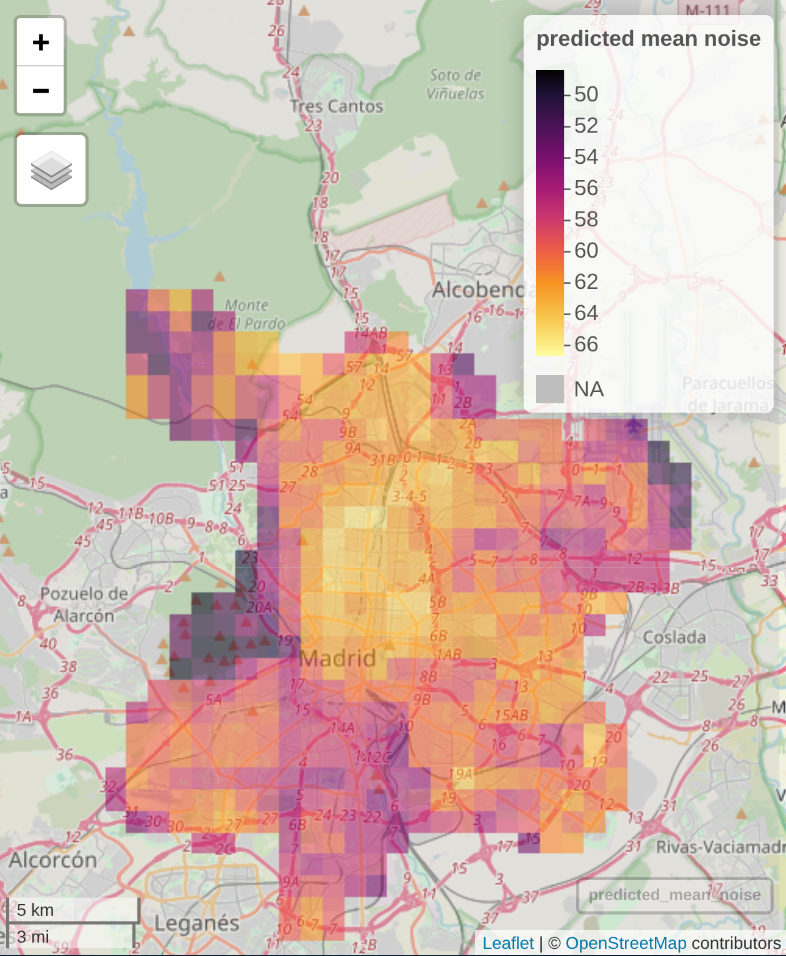</p>
</div></td>
<td style="text-align: left;"><div width="50.0%" data-layout-align="left">
<p>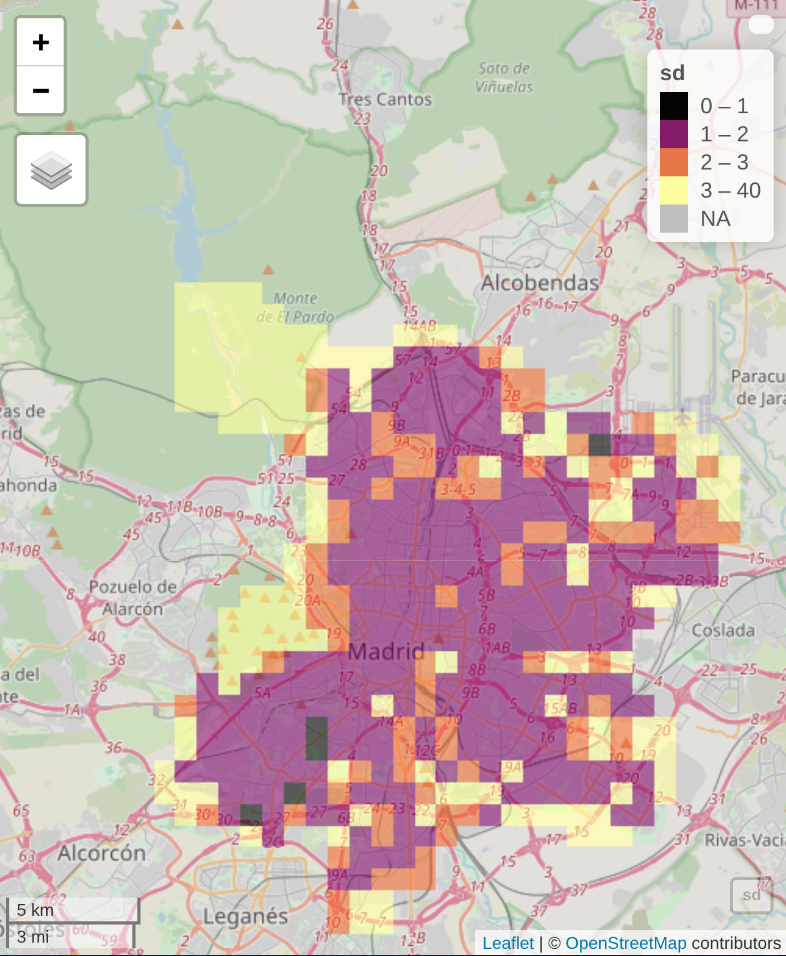</p>
</div></td>
</tr>
</tbody>
</table>

<table>
<colgroup>
<col style="width: 50%" />
<col style="width: 50%" />
</colgroup>
<tbody>
<tr>
<td style="text-align: left;"><div width="50.0%" data-layout-align="left">
<p>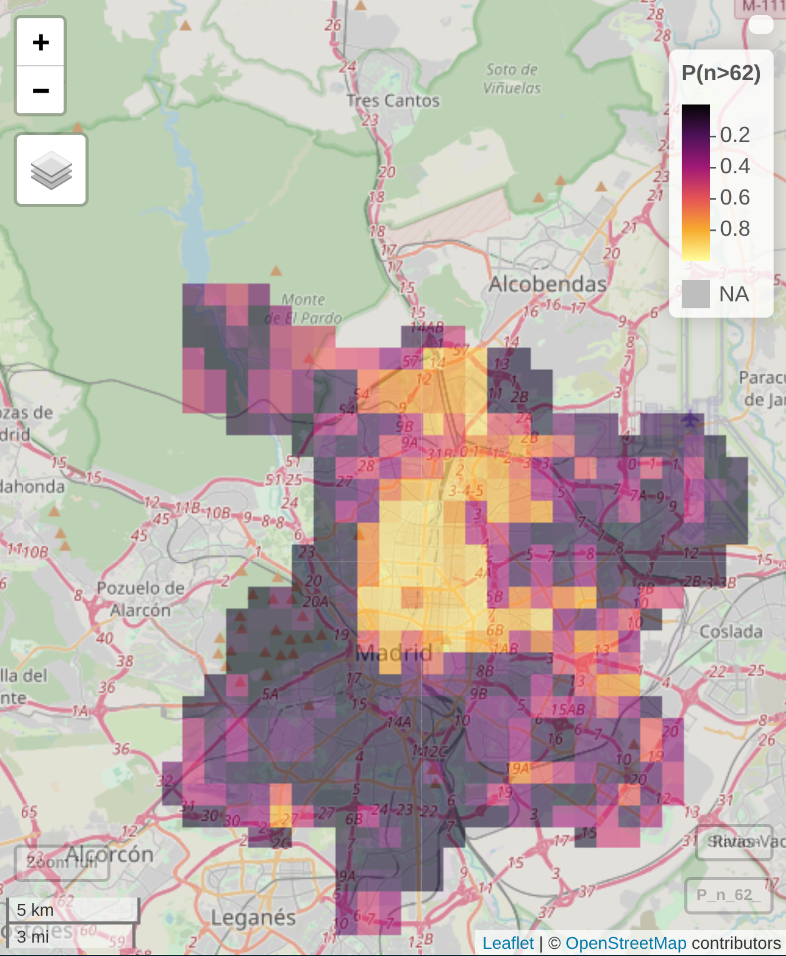</p>
</div></td>
<td style="text-align: left;"><div width="50.0%" data-layout-align="left">
<p>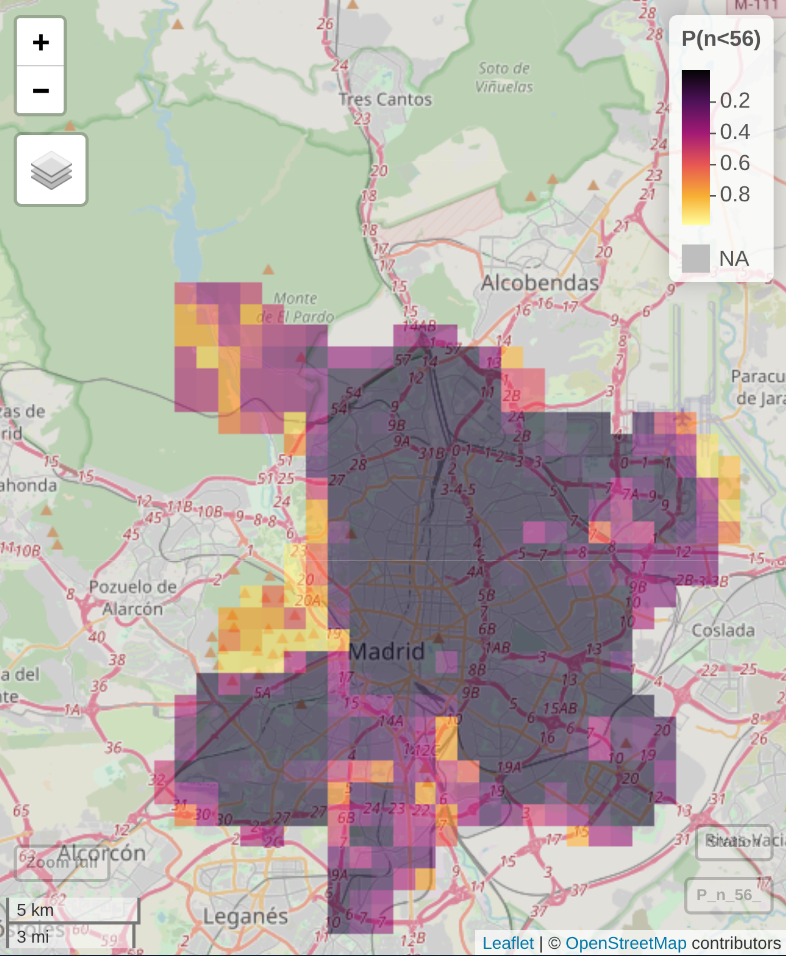</p>
</div></td>
</tr>
</tbody>
</table>

## Discussion

The spatial analysis revealed that noise pollution in Madrid is strongly influenced by topographic and infrastructural factors. The negative relationship between distance to secondary roads and noise levels highlights the dominant contribution of mid-tier traffic routes to the city’s acoustic environment. This finding aligns with prior studies emphasizing the importance of road proximity in shaping urban noise exposure patterns.

Interestingly, elevation showed a positive association with predicted noise levels, which likely reflects the spatial configuration of Madrid rather than a physical relationship. The city’s dense urban core is situated on relatively higher terrain, meaning that elevation may indirectly capture patterns of urbanization and traffic density rather than a direct topographic influence on noise propagation.

Although NDVI, distance to major roads, and distance to local roads were not statistically significant, their estimated directions remain consistent with theoretical expectations — greener and less accessible areas tend to be quieter. The moderate RMSE (3.18 dB) indicates reasonable model performance, suggesting that spatial and environmental covariates adequately capture much of the underlying variability in noise levels, though some unexplained local effects persist.

Spatial predictions further illustrated clear urban-rural gradients, with central districts and major traffic corridors exhibiting the highest noise intensities. Exceedance probability mapping reinforced this pattern, showing a high likelihood of exceeding the 62 dB threshold in central and traffic-dense areas. In contrast, quieter zones are mostly confined to the city’s peripheral and vegetated regions, particularly near the northwestern mountains.

### Limitations

Several limitations should be acknowledged in this study. First, the spatial distribution of noise monitoring stations is biased toward road networks and urban centers, potentially limiting the representativeness of quieter or rural areas. Second, although multiple environmental and infrastructural covariates were considered, the model did not include dynamic variables such as traffic volume, land use intensity, or building morphology, which may better explain local noise variations.

Thirdly, The model uses a Matérn spatial effect to capture residual spatial correlation, assuming that locations closer together tend to have more similar noise levels. However, in practice, the same distance between two points may correspond to very different noise conditions depending on local context. For example, two residential sites located the same distance from a major road may experience very different noise exposures if one is directly adjacent to the road while the other is shielded by buildings or green buffers. This illustrates a limitation of isotropic spatial models like the Matérn: they capture general spatial dependence but cannot fully account for fine-scale heterogeneity introduced by local urban structures.

Future work can also explore model prediction accuracy using cross-validation methods.

## Conclusions

In summary, this study mapped noise pollution across Madrid using yearly average LAeq measurements and geospatial covariates, including elevation, NDVI, and distances to roads. A Bayesian INLA-SPDE model captured spatial correlation, predicting highest noise levels in central districts and near major traffic corridors, while peripheral and greener areas remained quieter. Elevation showed a positive association, likely reflecting the urban core’s location rather than a direct effect, and other covariates were mostly non-significant. Despite moderate predictive accuracy (RMSE = 3.18 dB) and limitations such as biased station placement and stationary spatial assumptions, the results provide actionable insights for identifying high-risk noise areas and informing urban planning strategies.

## References